# 🐶 End-to-end Multi-class dog Breed Classification

This Notebook builds an end-to-end multi-class image classifier using tenserflow 2.0 and TenserFlow Hub

## 1.Problem

Identifying the breed of a dog given an image of a dog.

## 2.Data

The data we're using is from kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3.Evaluation

The evaluation is a file with prediction probabilities for each dog breed of eact test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4.Features

Some information about the data:
* We're dealing with images(unstructured data) so it's probably best to use deep learning/transfer learning.
* There are 120 breeds of dogs(this means there are 120 different classes).
* There are around 10000+ images in training set with labels and 10000+ images in test set with no label.


### Getting our workspace ready

In [1]:
import tensorflow as tf
print("TF version",tf.__version__)

TF version 2.12.0


In [2]:
import tensorflow_hub as hub
print("TF Hub Version",hub.__version__)
print("GPU","available (YESSS!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF Hub Version 0.14.0
GPU available (YESSS!!!)


## Getting data ready
                                    
With all machine learning models,our data has to be in numerical format.So that is what we'll be doing first.Turning our images into tensors(numerical representations).

In [3]:
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/DogVision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


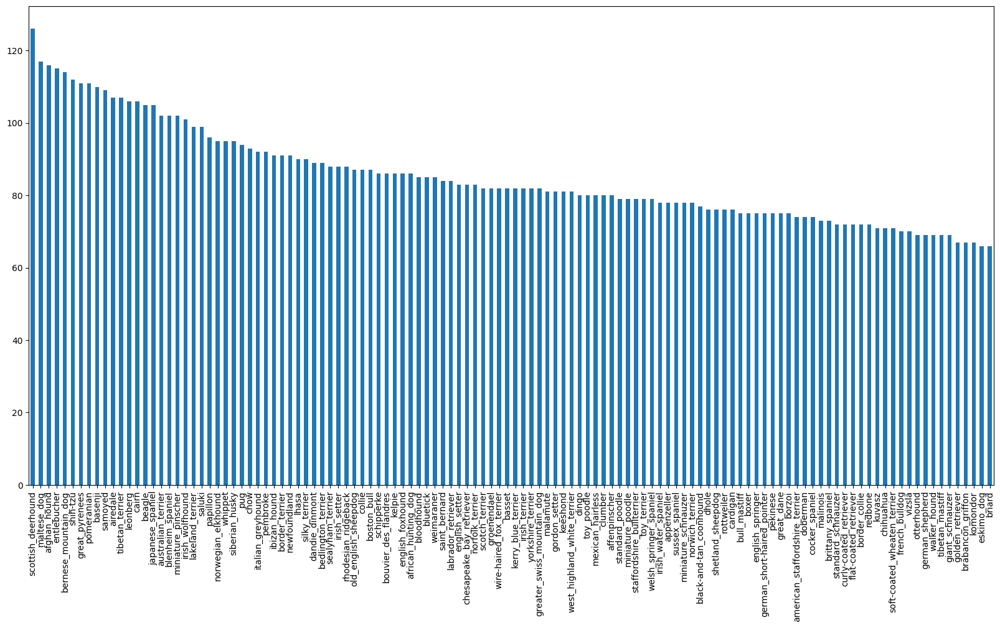

In [4]:
# How many images are there of each breed?
import matplotlib.pyplot as plt
%matplotlib inline
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [5]:
labels_csv["breed"].value_counts().median()

82.0

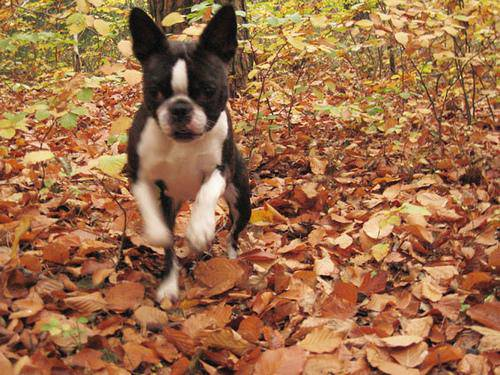

In [6]:
from IPython.display import Image
Image("drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

## Getting images and their labels

Lets's get a list of all our images file pathanames.

In [7]:
filenames=["drive/MyDrive/DogVision/train/"+filename+".jpg" for filename in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
import os
if len(os.listdir("drive/MyDrive/DogVision/train/"))==len(filenames):
  print("Filenames match actual amount of files!!!Proceed.")
else:
  print("Filename do not match actual amount of files,check the target directory.")

Filenames match actual amount of files!!!Proceed.


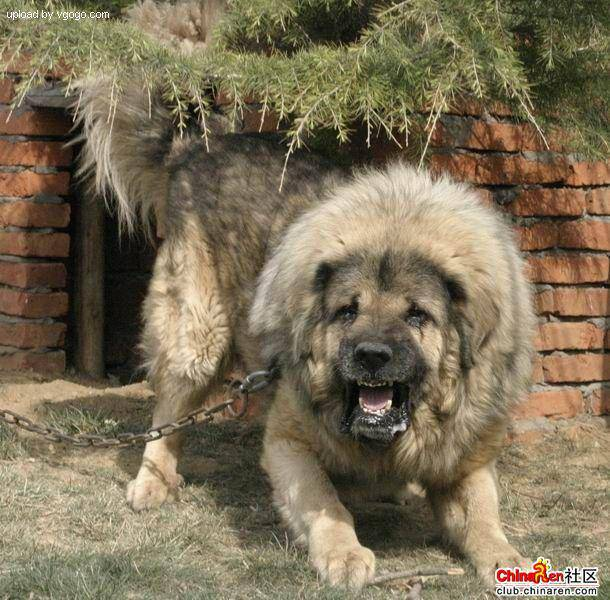

In [9]:
Image(filenames[9000])

Since we've now got our training image filepaths in a list,let's prepare our labels

In [10]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [11]:
len(labels)

10222

In [12]:
if len(labels)==len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames,check the data directory")

Number of labels matches number of filenames


In [13]:
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [14]:
len(unique_breeds)

120

In [15]:
# turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
# turn every label into a boolean array

boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [17]:
len(boolean_labels)

10222

In [18]:
# turning boolean array into intergers
print(labels[0])
print(np.where(unique_breeds==labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set we're going to create our own.

In [19]:
# set up X,y
X=filenames
y=boolean_labels

We're going to start off experimenting 1000 images and increase when needed.

In [20]:
NUM_IMAGES= 1000 #@param {type:"slider",min:1000,max:10000}

In [21]:
from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [22]:
X_train[:5],y_train[:5]

(['drive/MyDrive/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/DogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/DogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/DogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False

### Preprocessing Images(turning images into Tensors)

In [23]:
 #convert an image to a numpy arrays
 from matplotlib.pyplot import imread
 image=imread(filenames[42])
 image.shape

(257, 350, 3)

In [24]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [25]:
IMG_SIZE=224

def process_image(image_path):
  image=tf.io.read_file(image_path)
  image=tf.image.decode_jpeg(image,channels=3)
  image=tf.image.convert_image_dtype(image,tf.float32)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

### Turning or data into batches

Why turn our data into batches?

Let's say you're trying process 10000+ images in one go,they all might not fit into memory.
So that's why we do about 32(this is the batch size) images at a time(you can manually adjust the batch size)

In [26]:
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label

In [27]:
(process_image(X[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in form:(image,label),let's make a function to turn all our data(x & y) into batches!

In [38]:
BATCH_SIZE=32

def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    data=data.shuffle(buffer_size=len(X))
    data=data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)


In [30]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data batches

In [31]:
import matplotlib.pyplot as plt

def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [32]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [33]:
train_images,train_labels=next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

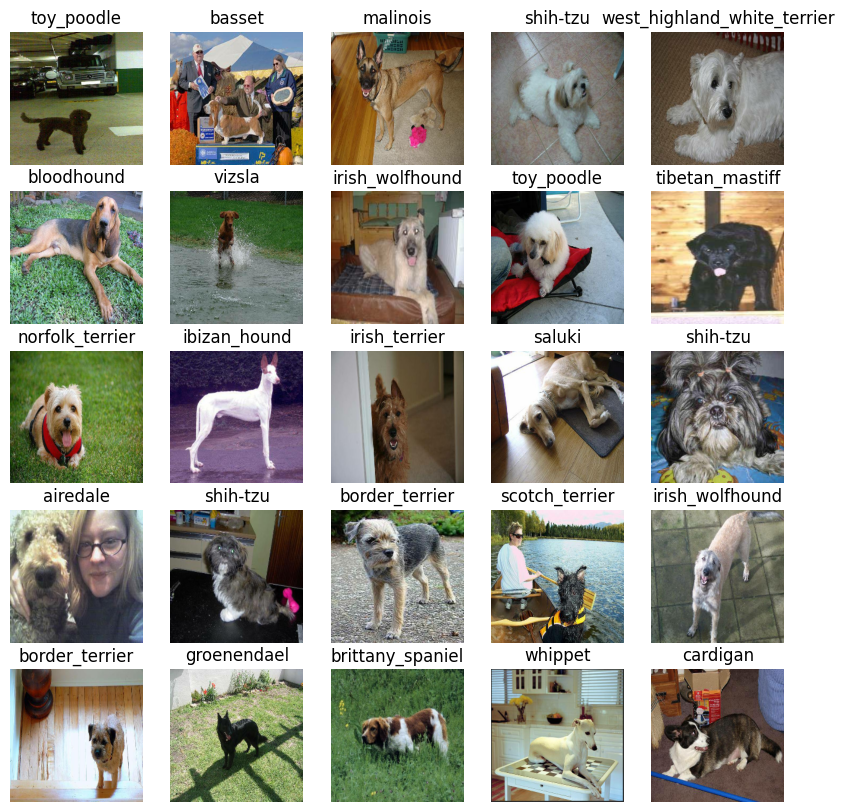

In [34]:
# now let's visualize our data in training data
show_25_images(train_images,train_labels)

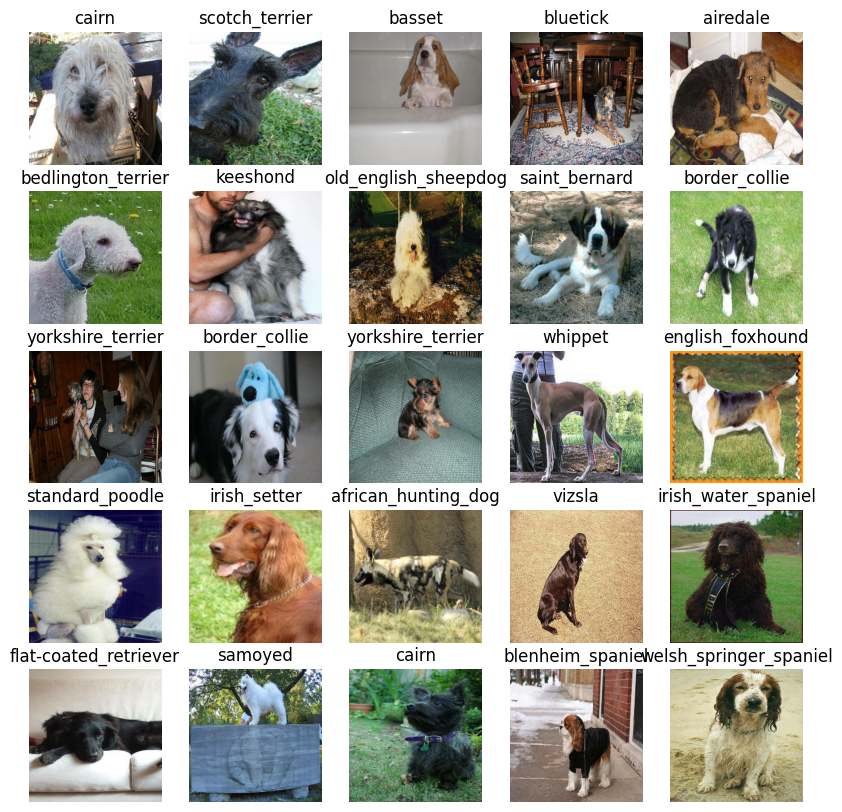

In [35]:
# now visualizing validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a Model

Before we build a model,there are a few things we need to define:
* the input shape
* the output shape
* the URL of the model we want to use.

In [36]:
IMG_SIZE

224

In [39]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE=len(unique_breeds)
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [42]:
# create a fucntion which creates a keras function

def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building a model with:",MODEL_URL)
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  model.build(INPUT_SHAPE)

  return model

In [43]:
model=create_model()
model.summary()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper fucntions that a model can use during training to do such things as save its progress,check its progress or stop training early if a model stops improving

In [44]:
 # load tensorboard notebook extension
 %load_ext tensorboard
 import datetime
 # create a function to build a tensorboard callback
 def create_tensorboard_callback():
  logdir=os.path.join("/content/drive/MyDrive/DogVision/log",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [45]:
# early stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

## Training a model(on a subset of data)



In [47]:
NUM_EPOCHS=100 #@param{type:"slider",min:10,max:100,step:10}

In [48]:
print("GPU","available(Yesss!!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available(Yesss!!!)


Let's create a model function which train a model.


In [50]:
def train_model():
  model=create_model()
  tensorboard=create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model


In [51]:
model=train_model()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 372s 14s/step - loss: 4.5970 - accuracy: 0.1100 - val_loss: 3.5020 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 3s 120ms/step - loss: 1.6493 - accuracy: 0.7025 - val_loss: 2.2279 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 3s 120ms/step - loss: 0.5809 - accuracy: 0.9275 - val_loss: 1.7439 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 4s 142ms/step - loss: 0.2555 - accuracy: 0.9837 - val_loss: 1.5505 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 4s 141ms/step - loss: 0.1485 - accuracy: 0.9987 - val_loss: 1.4848 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 3s 118ms/step - loss: 0.1013 - accuracy: 1.0000 - val_loss: 1.4256 - val_accuracy: 0.6800
Epoch 7/100
25/25 [============================

In [64]:
%tensorboard --logdir drive/MyDrive/DogVision/log

Output hidden; open in https://colab.research.google.com to view.

In [60]:
#!lsof -i :6006


COMMAND     PID USER   FD   TYPE DEVICE SIZE/OFF NODE NAME
tensorboa 20955 root   14u  IPv4 540047      0t0  TCP localhost:6006 (LISTEN)


In [63]:
#!sudo kill 20955


### Making and Evaluating predictions using trained model

In [65]:
predictions=model.predict(val_data,verbose=1)

7/7 [==============================] - 1s 115ms/step


In [66]:
predictions.shape

(200, 120)

In [70]:
# First prediction
index=42
print(predictions[0])
print(f"Max value(probability of prediction):{np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[5.58099127e-04 1.52992026e-04 5.34204999e-04 1.55291360e-04
 3.28623602e-04 8.64069898e-06 1.70677435e-02 1.07625115e-03
 6.79735444e-04 5.93679724e-04 7.11915141e-04 1.34788439e-04
 6.63107494e-04 2.11047285e-04 4.92038380e-04 7.75556618e-05
 3.50080845e-05 1.52651727e-01 9.40864902e-06 5.66719282e-05
 8.18509900e-04 3.14870325e-04 4.05664250e-05 1.43413967e-03
 9.66261359e-05 1.12316520e-04 3.01950395e-01 5.64484544e-05
 1.23823120e-04 2.23995230e-04 2.58178734e-05 2.62291229e-04
 5.28268691e-04 1.11138652e-04 4.87600882e-05 1.47034004e-01
 6.96150528e-05 7.34254209e-05 5.39421417e-05 1.23766513e-04
 1.71935908e-03 8.08461773e-05 9.90323388e-05 6.99977099e-05
 2.87896146e-05 1.41704484e-04 2.47354492e-05 1.34507788e-03
 3.25068861e-04 1.32401299e-04 2.36126740e-04 2.80764252e-05
 7.49350060e-04 1.88107770e-05 1.30558285e-04 1.03599632e-04
 9.67795932e-05 1.39849703e-03 8.62161105e-04 8.92591327e-02
 1.09586610e-04 5.34786850e-05 1.69349008e-03 2.43059312e-05
 3.29228758e-04 1.769702

In [71]:
unique_breeds[113]

'walker_hound'

In [72]:
# Turn prediciton probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label=get_pred_label(predictions[0])
pred_label

'cairn'

In [73]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [86]:
def unbatchify(data):
  images_=[]
  labels_=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_,labels_


In [87]:
val_images,val_labels=unbatchify(val_data)

Let's make it all a bit visual

In [92]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]
  pred_label=get_pred_label(pred_prob)
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  if pred_label==true_label:
    color="green"
  else:
    color="red"
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


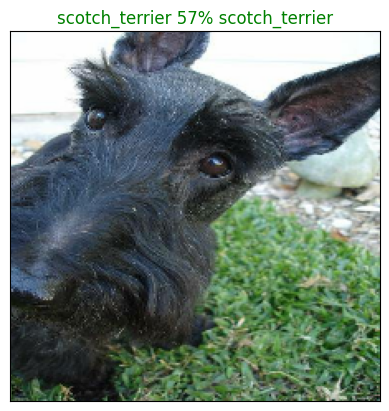

In [93]:
plot_pred(predictions,val_labels,val_images)

In [100]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  pred_label=get_pred_label(pred_prob)
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,rotation="vertical")
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
      pass

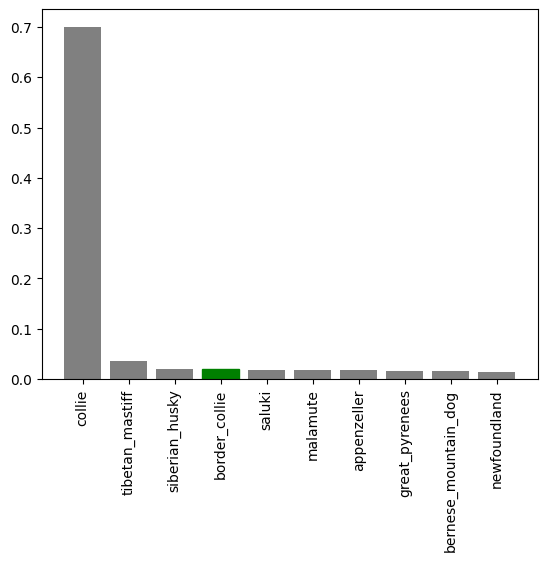

In [101]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

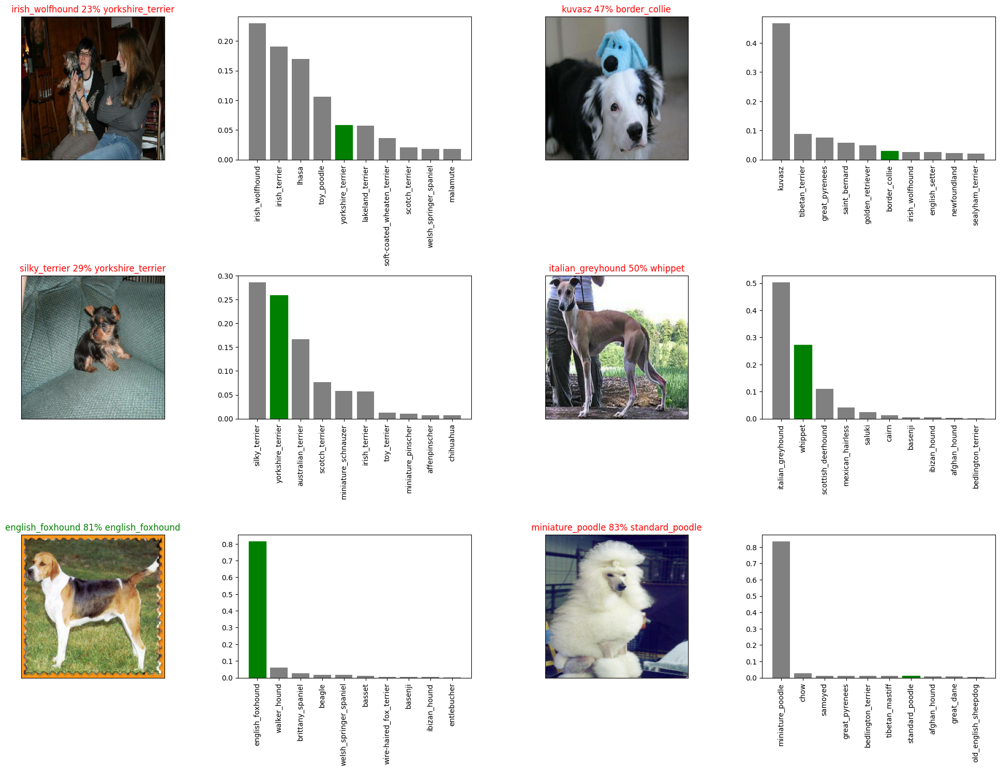

In [104]:
# Let's check out a few predictions and their different values
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [106]:
def save_model(model,suffix=None):
  modeldir=os.path.join("drive/MyDrive/DogVision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path=modeldir+"-"+suffix+".h5"
  print(f"Saving model to:{model_path}...")
  model.save(model_path)
  return model_path

In [107]:
def load_model(model_path):
  print(f"Loading saved model from:{model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [108]:
save_model(model,suffix="1000-images")

Saving model to:drive/MyDrive/DogVision/models/20230723-003007-1000-images.h5...


'drive/MyDrive/DogVision/models/20230723-003007-1000-images.h5'

In [109]:
loaded_model_1000_images=load_model("drive/MyDrive/DogVision/models/20230723-003007-1000-images.h5")

Loading saved model from:drive/MyDrive/DogVision/models/20230723-003007-1000-images.h5


In [110]:
model.evaluate(val_data)

7/7 [==============================] - 1s 140ms/step - loss: 1.3591 - accuracy: 0.6800


[1.3590688705444336, 0.6800000071525574]

In [111]:
loaded_model_1000_images.evaluate(val_data)

7/7 [==============================] - 2s 173ms/step - loss: 1.3591 - accuracy: 0.6800


[1.3590688705444336, 0.6800000071525574]

## Training our model on full data

In [112]:
# create a databatch with full data
full_data=create_data_batches(X,y)

Creating training data batches...


In [113]:
full_model=create_model()

Building a model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [114]:
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

In [115]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3085s 10s/step - loss: 1.3379 - accuracy: 0.6687
Epoch 2/100
320/320 [==============================] - 35s 109ms/step - loss: 0.3985 - accuracy: 0.8837
Epoch 3/100
320/320 [==============================] - 36s 111ms/step - loss: 0.2381 - accuracy: 0.9361
Epoch 4/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1533 - accuracy: 0.9640
Epoch 5/100
320/320 [==============================] - 35s 109ms/step - loss: 0.1056 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 35s 109ms/step - loss: 0.0769 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0584 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 34s 106ms/step - loss: 0.0456 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 36s 113ms/step - loss: 0.0377 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 34s 105m

In [116]:
save_model(full_model,suffix="full-image-set")

Saving model to:drive/MyDrive/DogVision/models/20230723-014316-full-image-set.h5...


'drive/MyDrive/DogVision/models/20230723-014316-full-image-set.h5'

In [117]:
loaded_full_model=load_model("drive/MyDrive/DogVision/models/20230723-014316-full-image-set.h5")

Loading saved model from:drive/MyDrive/DogVision/models/20230723-014316-full-image-set.h5


## Making predictions on test dataset

In [118]:
test_path="drive/MyDrive/DogVision/test/"
test_filenames=[test_path+ fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/DogVision/test/e73efb021b7b49e328b2159d34060b82.jpg',
 'drive/MyDrive/DogVision/test/e743bea73da2c0dab99ccdbc697b1ac8.jpg',
 'drive/MyDrive/DogVision/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 'drive/MyDrive/DogVision/test/e7e9dd51302fe08c1c89a550e183cf07.jpg',
 'drive/MyDrive/DogVision/test/e8232c9a79f0e77e9b4c5fca60682d41.jpg',
 'drive/MyDrive/DogVision/test/e8319b1410a984291d71a3e60c84d86c.jpg',
 'drive/MyDrive/DogVision/test/e85b19a69be67eaef9fe58b7e689ee81.jpg',
 'drive/MyDrive/DogVision/test/e85d4e2707683df0e6387e19b67b873d.jpg',
 'drive/MyDrive/DogVision/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 'drive/MyDrive/DogVision/test/e8505566fd9116b812e306ca196b62da.jpg']

In [119]:
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [120]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [121]:
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 3850s 12s/step


In [122]:
np.savetxt("drive/MyDrive/DogVision/pred_array.csv",test_predictions,delimiter=",")

## Getting test predictions ready for submission on kaggle

In [123]:
preds_df=pd.DataFrame(columns=["ID"]+list(unique_breeds))
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [126]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [128]:
preds_df["ID"]=test_ids

In [129]:
preds_df[list(unique_breeds)]=test_predictions

In [130]:
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e73efb021b7b49e328b2159d34060b82,4.753808e-09,5.005791e-08,1.225747e-07,1.425713e-06,9.000376e-06,5.829538e-07,1.349496e-09,4.986111e-09,1.571846e-05,...,8.217792e-07,2.391753e-07,1.067307e-03,5.515608e-05,2.925799e-03,1.640340e-08,1.356972e-08,6.366827e-07,7.950856e-09,7.611167e-09
1,e743bea73da2c0dab99ccdbc697b1ac8,5.310917e-13,2.179015e-12,2.979820e-09,1.284507e-12,2.806900e-09,6.206322e-07,2.212192e-10,3.282172e-05,1.903075e-11,...,9.339361e-11,3.805241e-07,4.600146e-09,1.073644e-07,1.303454e-09,1.759199e-07,7.300493e-11,2.788029e-08,1.062301e-06,2.546346e-07
2,e7dc8cc599049ea9fa2a172c88646c57,1.786807e-06,1.824699e-08,3.301929e-08,1.222273e-10,7.507591e-07,2.413712e-08,2.599178e-09,3.093367e-08,9.931723e-11,...,2.469885e-07,1.860634e-08,5.383696e-09,3.355770e-08,8.056351e-09,1.052827e-08,5.820525e-07,1.189490e-10,4.161471e-07,1.188582e-07
3,e7e9dd51302fe08c1c89a550e183cf07,4.417093e-04,3.580316e-08,1.032430e-08,1.477670e-06,3.076004e-07,5.667628e-09,1.282240e-02,7.110850e-08,5.362329e-09,...,1.455325e-07,1.701432e-03,1.309942e-08,8.167422e-10,1.943141e-09,9.506360e-10,8.874867e-06,7.574717e-08,1.342925e-05,9.825996e-01
4,e8232c9a79f0e77e9b4c5fca60682d41,3.514573e-13,4.744433e-07,1.641494e-11,5.087294e-08,5.393748e-12,2.915616e-11,1.293056e-12,5.180648e-13,1.812621e-07,...,6.329898e-12,2.713844e-12,5.706084e-10,2.683951e-09,4.169544e-10,1.604953e-10,1.127298e-13,4.474897e-10,1.059896e-08,1.916747e-09


In [131]:
preds_df.to_csv("drive/MyDrive/DogVision/full-model-predictions.csv",index=False)